## DS 7333 - Quantifying the World
## Case Study #5: "Working with Missing Data"

Sterling Beason, Sean Kennedy, Emil Ramos

### Introduction

In this case study, we will be working with missing data using the Boston house-price data. We will simply be exploring the change in results by performing imputations for the missing values for multiple variables.

In [2]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from IPython.display import Markdown as md
import seaborn as sns

C:\Users\Owner\New folder\envs\ML7331\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
def take_two(data,
             null_cols=[],
             test_col='AGE',
             cond='>10',
             impute_func=np.mean,
             samples=[.1, .2, .3]):
    assert callable(impute_func)
    assert isinstance(test_col, str)
    assert isinstance(cond, str)
    data_frames = {}
    for sample_rate in samples:
        df = data.copy()
        replace_index = df.query(f'{test_col}{cond}').sample(
            frac=sample_rate, replace=False).index
        print(f'Percent of imputed values:{(len(replace_index)/len(df.index)):,.2%}')
        df.loc[replace_index, null_cols] = None
        imputed = impute_func(df.loc[df.index.difference(replace_index),
                                     null_cols],
                              axis=0)
        print(f'{imputed}\n{impute_func}\n{sample_rate}', end='\n')
        [
            df[x].fillna(imputed[i], inplace=True)
            for i, x in enumerate(null_cols)
        ]
        data_frames.update({sample_rate: df})
    return data_frames

In [4]:
# load data
boston = load_boston()

In [5]:
# display data descriptions
md(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
        - B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
        - LSTAT    % lower status of the population
        - MEDV     Median value of owner-occupied homes in $1000's

    :Missing Attribute Values: None

    :Creator: Harrison, D. and Rubinfeld, D.L.

This is a copy of UCI ML housing dataset.
https://archive.ics.uci.edu/ml/machine-learning-databases/housing/


This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University.

The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic
prices and the demand for clean air', J. Environ. Economics & Management,
vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics
...', Wiley, 1980.   N.B. Various transformations are used in the table on
pages 244-261 of the latter.

The Boston house-price data has been used in many machine learning papers that address regression
problems.   
     
.. topic:: References

   - Belsley, Kuh & Welsch, 'Regression diagnostics: Identifying Influential Data and Sources of Collinearity', Wiley, 1980. 244-261.
   - Quinlan,R. (1993). Combining Instance-Based and Model-Based Learning. In Proceedings on the Tenth International Conference of Machine Learning, 236-243, University of Massachusetts, Amherst. Morgan Kaufmann.


### DataFrame Creation & Data Partitioning

In [5]:
# create independent and dependent dataframes
df = pd.DataFrame(boston.data, columns=boston.feature_names) # features dataframe
df_targets = pd.DataFrame(boston.target, columns=['target']) # targets dataframe

In [6]:
# partition data
X_train, X_test, y_train, y_test = train_test_split(df, df_targets.target, test_size=0.33, random_state=7337)

### Explore Data

#### Feature Correlation

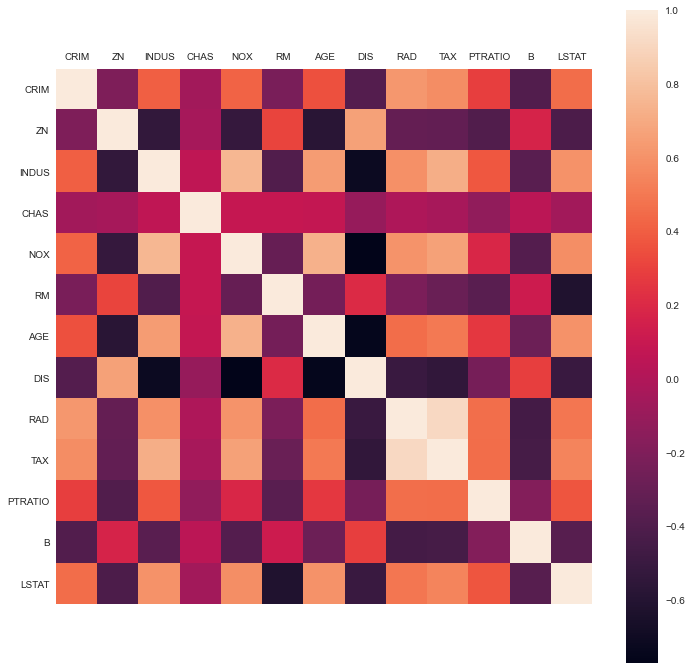

In [7]:
fig, ax = plt.subplots(figsize=(12,12))
im = ax.matshow(df.corr())
ax.set_xticks(np.arange(len(df.columns))) # force to show all x labels
ax.set_yticks(np.arange(len(df.columns))) # force to show all y labels
ax.set_xticklabels(df.columns)
ax.set_yticklabels(df.columns)
fig.colorbar(im)
plt.show()

Based on the correlation matrix above, we chose to interpret the following variables:

B     - 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
LSTAT - % lower status of the population
Age   - proportion of owner-occupied units built prior to 1940

- LSTAT has a positive correlation with CRIM, as the crime rate by town(CRIM) increases relates to the lower stataus of the population in that part of town There is also a positive correlation between LSTAT and AGE. The percent of lower status of the population is high in areas where proportion of owner-occupied units built prior to 1940 are also high. Typically, neighborhoods with old housing tend to have a lower status of population since they are typically cheaper. Where as newer homes tend to cater to those with higher status of the population because they are able to afford this type of housing. 
- Conversely, B and AGE are inversely correlated since proportion of homes built prior to 1940 tend to have a low percentage of proportion of blacks by town. For example, neighborhoods that were prestigious prior to 1940 and still carry that prestige today still have a low percentage of proportion of black people living in these neighborhoods. 
- LSTAT is inversely correlated to ZN, RM, DIS. As the % of lower status of the population increases, the ZN, RM, DIS drop. For example, the average number of rooms in houses(RM) in lower status neighborhoods is low compared to number of rooms in houses in more prestigious neighborhoods.

#### Profile Dataset

In [8]:
profile = ProfileReport(df, title="Boston Features Profile")
profile.to_notebook_iframe()

### Step 2: 

Randomize 1%, 5% 10%, 20%, 33%, and 50% missing values in a single column

In [9]:
df_dict = {} # will hold dataframes with various % of missing values
percentages = [0.01, 0.05, 0.1, 0.2, 0.33, 0.5]
column = 'AGE'

for p in percentages:
    in_sample = df.sample(frac=p, random_state=42) # sample copy dataframe with fraction at p
    in_sample[column] = np.NaN # set selected column values to NaN

    out_sample = df[~df.isin(in_sample)].dropna()
    
    df_dict[str(int(p * 100))] = pd.concat([out_sample, in_sample]).sort_index() 
    

In [10]:
for key in df_dict.keys():
    print(f"df_dict[\"{key}\"]: '{column}' column, in {int(key) / 100}%",
          f"sampled dataframe, has {df_dict[key].isnull().sum()[column]}",
          f"of {df_dict[key].shape[0]} missing values")
          

df_dict["1"]: 'AGE' column, in 0.01% sampled dataframe, has 5 of 506 missing values
df_dict["5"]: 'AGE' column, in 0.05% sampled dataframe, has 25 of 506 missing values
df_dict["10"]: 'AGE' column, in 0.1% sampled dataframe, has 51 of 506 missing values
df_dict["20"]: 'AGE' column, in 0.2% sampled dataframe, has 101 of 506 missing values
df_dict["33"]: 'AGE' column, in 0.33% sampled dataframe, has 167 of 506 missing values
df_dict["50"]: 'AGE' column, in 0.5% sampled dataframe, has 253 of 506 missing values


### Baseline Model w/o Missing Values

In [26]:
reg = LinearRegression(normalize=True, fit_intercept=True)
fit = reg.fit(X_train, y_train)
baseline_score  = reg.score(X_train, y_train)
print(baseline_score)
baseline_score_test  = reg.score(X_test, y_test)
print(baseline_score_test)

0.7196488510369425
0.752261366497078


Let's get the fitted values from the model, since sk-learn sucks and doesn't give them to you in the call to .fit()

In [117]:
fitted = fit.predict(X_train)

### Plot of Fitted Values v Actual (baseline)

Text(0.5, 1.0, 'Baseline Fitted vs Actual')

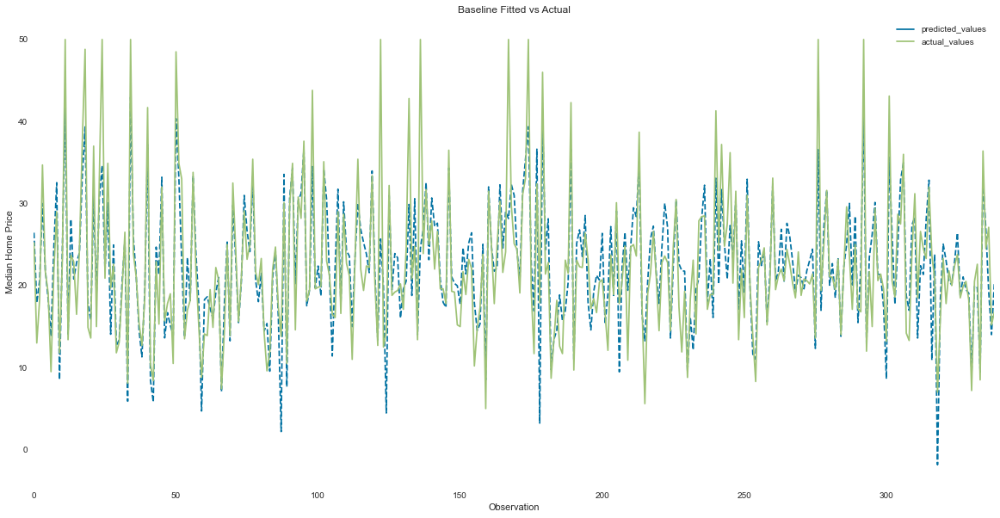

In [118]:
fig, ax = plt.subplots(figsize=(20, 10), nrows=1, ncols=1)
p = pd.DataFrame({
    'index': range(len(fitted)),
    'predicted_values': fitted,
    'actual_values': y_train
}).set_index('index').plot(kind='line', ax=ax)

p.lines[0].set_linestyle('--')
p.set_xlabel('Observation')
p.set_ylabel('Median Home Price')
p.set_title('Baseline Fitted vs Actual')

***Baseline Parameters***

Unfortunately sklearn is not R and does not give confidence intervals for parameter estimates, but we can still see the effect that imputation has on the structure of the model by comparing how the parameter estimates change as a result of our imputation scheme.

In [111]:
keys = list(X_train.columns)
keys.append('Intercept')
params = list(fit.coef_)
params.append(fit.intercept_)
baseline_params = pd.DataFrame(zip(keys, params)).rename(columns={
    0: 'Field',
    1: 'Baseline Parameter Estimate'
})
baseline_params

,Field,Baseline Parameter Estimate
0,CRIM,-0.069434
1,ZN,0.037477
2,INDUS,0.030331
3,CHAS,4.153992
4,NOX,-19.290708
5,RM,3.651212
6,AGE,-0.000488
7,DIS,-1.353645
8,RAD,0.249161
9,TAX,-0.006062


### Step 3: 

Take two columns and create data “Missing at Random” when controlled for a third variable (i.e., if Variable Z is > 30, then Variables X, Y are randomly missing).  Use your preferred imputation method to fill in 10%, 20% and 30% of your missing data.


The function defined below will take any arbitrary combination of columns to be imputed based on a criterion specified for another column. An impution function will be applied to a set of records based on the number of records that meet the criterion and a sample rate. This could be used for a much more exhaustive search for impution schemes if one were so inclined.

For this test - **B and LSTAT** will be imputed to the **mean** wherever **AGE** is less than 40.

In [119]:
samples = take_two(X_train,
                   null_cols=['B', 'LSTAT'],
                   test_col='AGE',
                   cond='<60',
                   samples=np.linspace(0, 1, 100),
                   impute_func=np.mean)

Percent of imputed values:0.00%
B        355.621091
LSTAT     12.619853
dtype: float64
<function mean at 0x0000020777C94378>
0.0
Percent of imputed values:0.29%
B        355.506183
LSTAT     12.635178
dtype: float64
<function mean at 0x0000020777C94378>
0.010101010101010102
Percent of imputed values:0.88%
B        355.287054
LSTAT     12.674762
dtype: float64
<function mean at 0x0000020777C94378>
0.020202020202020204
Percent of imputed values:1.18%
B        355.228866
LSTAT     12.660716
dtype: float64
<function mean at 0x0000020777C94378>
0.030303030303030304
Percent of imputed values:1.47%
B        355.036228
LSTAT     12.730329
dtype: float64
<function mean at 0x0000020777C94378>
0.04040404040404041
Percent of imputed values:1.77%
B        355.067688
LSTAT     12.675706
dtype: float64
<function mean at 0x0000020777C94378>
0.05050505050505051
Percent of imputed values:2.36%
B        354.714139
LSTAT     12.718731
dtype: float64
<function mean at 0x0000020777C94378>
0.0606060606060606

In [78]:
X_train[X_train.AGE < 60].shape[0]/X_train.shape[0]

0.3775811209439528

Setting a 10/20/30% sample rate for the rows that match our criteria equates to imputing 3.83%/7.67%/11.21% of our values to the target scheme (in this case, the mean). Note that the mean for **B** declines as the sample rate increases (354.18 - 351.3) whereas **LSTAT** increases as the sample rate increases (12.84-13.26). 

### Refitting LR model to new data frames

In [157]:
for rate, data in samples.items():
    print(f'{rate:.2%} sample rate results:')
    reg = LinearRegression(normalize=True, fit_intercept=True)
    fit = reg.fit(data, y_train)
    train_score = reg.score(X_train, y_train)
    test_score = reg.score(X_test, y_test)
    print(
        f'Train: {train_score:.6f} is {" better than " if train_score > baseline_score else " worse than " }baseline R2'
    )
    print(
        f'Test: {test_score:.6f} is {" better than " if test_score > baseline_score_test else " worse than " }baseline R2'
    )

10.00% sample rate results:
Train: 0.719177 is  worse than baseline R2
Test: 0.754730 is  better than baseline R2
20.00% sample rate results:
Train: 0.717919 is  worse than baseline R2
Test: 0.752540 is  better than baseline R2
30.00% sample rate results:
Train: 0.717504 is  worse than baseline R2
Test: 0.757696 is  better than baseline R2



### Question 3: 

In each case [10%, 20%, 30%] perform a fit with the imputed data and compare the loss and goodness of fit to your baseline.  [Note: you should have (9) models to compare against your baseline at this point.]


Using the mean impution scheme described above, all 3 models were slightly better than our baseline model on the testing set - on the training set, they were all slightly worse. The best of the three models (out of sample) was the 30% sample rate model (0.75696 vs 0.75226 $R^2$)


For fun, let's try the same example with the **median**

In [158]:
samples = take_two(X_train,
                   null_cols=['B', 'LSTAT'],
                   test_col='AGE',
                   cond='<60',
                   impute_func=np.median)

Percent of imputed values:3.83%
[390.945  11.465]
<function median at 0x0000027E46C52C80>
0.1
Percent of imputed values:7.67%
[390.74  11.98]
<function median at 0x0000027E46C52C80>
0.2
Percent of imputed values:11.21%
[390.86  12.33]
<function median at 0x0000027E46C52C80>
0.3


In [159]:
for rate, data in samples.items():
    print(f'{rate:.2%} sample rate results:')
    reg = LinearRegression(normalize=True, fit_intercept=True)
    fit = reg.fit(data, y_train)
    train_score = reg.score(X_train, y_train)
    test_score = reg.score(X_test, y_test)
    print(
        f'Train: {train_score:.6f} is {" better than " if train_score > baseline_score else " worse than " }baseline R2'
    )
    print(
        f'Test: {test_score:.6f} is {" better than " if test_score > baseline_score_test else " worse than " }baseline R2'
    )

10.00% sample rate results:
Train: 0.719102 is  worse than baseline R2
Test: 0.755050 is  better than baseline R2
20.00% sample rate results:
Train: 0.717601 is  worse than baseline R2
Test: 0.754133 is  better than baseline R2
30.00% sample rate results:
Train: 0.715893 is  worse than baseline R2
Test: 0.753947 is  better than baseline R2


For fun, let's try the same example with the **median** but also change the cutoff from 60 years to 85 years. We wrote the code to be experimental after all!

In [160]:
samples = take_two(X_train,
                   null_cols=['B', 'LSTAT'],
                   test_col='AGE',
                   cond='<85',
                   impute_func=np.median)

Percent of imputed values:5.90%
[390.95  11.45]
<function median at 0x0000027E46C52C80>
0.1
Percent of imputed values:11.50%
[390.925  11.73 ]
<function median at 0x0000027E46C52C80>
0.2
Percent of imputed values:17.40%
[390.565  12.125]
<function median at 0x0000027E46C52C80>
0.3


In [161]:
for rate, data in samples.items():
    print(f'{rate:.2%} sample rate results:')
    reg = LinearRegression(normalize=True, fit_intercept=True)
    fit = reg.fit(data, y_train)
    train_score = reg.score(X_train, y_train)
    test_score = reg.score(X_test, y_test)
    print(
        f'Train: {train_score:.6f} is {" better than " if train_score > baseline_score else " worse than " }baseline R2'
    )
    print(
        f'Test: {test_score:.6f} is {" better than " if test_score > baseline_score_test else " worse than " }baseline R2'
    )

10.00% sample rate results:
Train: 0.719378 is  worse than baseline R2
Test: 0.754127 is  better than baseline R2
20.00% sample rate results:
Train: 0.717881 is  worse than baseline R2
Test: 0.755723 is  better than baseline R2
30.00% sample rate results:
Train: 0.715116 is  worse than baseline R2
Test: 0.759534 is  better than baseline R2


Using the median impution scheme described above, all 3 models were slightly better than our baseline model on the testing set - on the training set, they were all slightly worse. The best of the three models (out of sample) was the 30% sample rate model (0.759534 vs 0.75226 $R^2$). This particular scheme (median/>85 cutoff) produced the best results in this analysis. Note that this also had the most samples imputed - 17.40% of the data.

### Step 4:  

Create a “Missing Not at Random” pattern in which 25% of the data is missing for a single column.

Let's cut off the top 25% of **AGE** since it seems to be very skewed and then impute the missing data to **mean**.

In [177]:
cuts, bins = pd.qcut(X_train['AGE'], q=[0, .25, .5, .75, 1.], labels=['Q1', 'Q2', 'Q3', 'Q4'], retbins=True)

In [179]:
bins

array([  2.9 ,  42.15,  77.7 ,  94.05, 100.  ])

Cutting out the top **25%** of the Age range leaves houses that are less than **94.05** years old.

In [181]:
sample = X_train.copy()
remove_index = cuts[cuts=='Q4'].index
sample.loc[remove_index, 'AGE'] = None
sample_mean = sample.loc[sample.index.difference(remove_index), 'AGE'].mean()
sample.loc[remove_index, 'AGE'] = sample_mean

In [183]:
sample['AGE'].describe()

count    339.000000
mean      57.982283
std       23.205433
min        2.900000
25%       42.150000
50%       57.982283
75%       77.500000
max       94.000000
Name: AGE, dtype: float64

### Question 4: 

Perform a fit with the imputed data [25%] and compare the loss and goodness of fit to your baseline.  [Note: you should have (10) models to compare against your baseline at this point.]

In [186]:
reg = LinearRegression(normalize=True, fit_intercept=True)
fit = reg.fit(sample, y_train)
train_score = reg.score(X_train, y_train)
test_score = reg.score(X_test, y_test)
print(
    f'Train: {train_score:.6f} is {" better than " if train_score > baseline_score else " worse than " }baseline R2'
)
print(
    f'Test: {test_score:.6f} is {" better than " if test_score > baseline_score_test else " worse than " }baseline R2'
)

Train: 0.716569 is  worse than baseline R2
Test: 0.757745 is  better than baseline R2


### Step 5:

Describe your imputation approach and summarize your findings.  What impact did the missing data have on your baseline model’s performance?

Baseline Score = 0.75226

In Step 3, we decided to impute variables "B" and "LSTAT" to the mean whererver "AGE" is less than 60. The **take_two** function will take any arbitrary combination of columns to be imputed based on a criterion specified for another column. The specified impution function will be applied to a set of records based on the number of records that meet the criterion and a random sample based on the sample rate. Using the mean imputation scheme described above, all 3 models (in step 3) were slightly better than our baseline model on the testing set - on the training set, they were all slightly worse. The best of the three models (out of sample) was the 30% sample rate model (0.75696 vs 0.75226 $𝑅^2$ ) 

Given the definitions of these variables (chosen specifically for their social context - see data dictionary) the simplest interpretation of these trends is that as we impute more values of homes with ages less than 60, the concetration of African Americans decreases - this imples that older homes (>60) are located in areas with lower concentrations of African Americans. Conversely, the concentration of those considered "lower-class" increased as we imputed values of homes with ages less than 60. Again, this points to a higher concetration of lower-class individuals with homes over 60 years in age.

After experimenting with the mean imputation scheme, we decided to try the same scheme using the median[10%, 20%, 30%]. We found that all 3 models were slightly better than our baseline model on the testing set - on the training set, they were all slightly worse. The best of the three models (out of sample) was the 30% sample rate model (0.759534 vs 0.75226  $𝑅^2$ ). This particular scheme (median/>85 cutoff) produced the best results in this analysis. Note that this also had the most samples imputed - 17.40% of the data.

In step 4, we decided to cut off the top 25% of AGE since it seems to be very skewed and then impute the missing data to mean. Cutting out the top 25% of the Age range leaves houses that are less than 94.05 years old.